### Initial run

Initial end to end test, a sort of a "teaser" to highlight the motivation for `concurrent_dataloader`. 

In [1]:
from benchmarking.analysis.analyze_results import *

In [2]:
output_base_folder = Path("/iarai/home/ivan.svogor/storage-benchmarking/benchmark_output/motivation/last_run")

In [3]:
s3_folder_filter="*s3*"
scratch_folder_filter="*scratch*"

Load the data

In [4]:
df_dataloader_s3 = extract_timelines(output_base_folder, folder_filter=s3_folder_filter)
df_dataloader_scratch = extract_timelines(output_base_folder, folder_filter=scratch_folder_filter)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:00<00:00, 200.19it/s]


Create "colors" and "lanes". Colors are used to distinguish different function types, e.g. function that loads a batch, calls the `next_data`, `run_traning_batch` from Lightning and `training_batch_to_device` also from lightning.
Lanes, every single call of the aforementioned funcitons in their own respective lane, so we get a nice overview of when the function is called, and how long it tookl

Extract the GPU Utilization data

In [5]:
df_gpuutil_s3 = extract_gpuutil(output_base_folder, folder_filter=s3_folder_filter, ms=True, skip=8)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:53<00:00,  2.09it/s]


In [6]:
df_gpuutil_scratch = extract_gpuutil(output_base_folder, folder_filter=scratch_folder_filter, ms=True, skip=8)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:04<00:00, 24.46it/s]


### Plot function timelines for remote storage (AWS S3)

timestamp_2 True
72.72841091492776 42.63017447827574


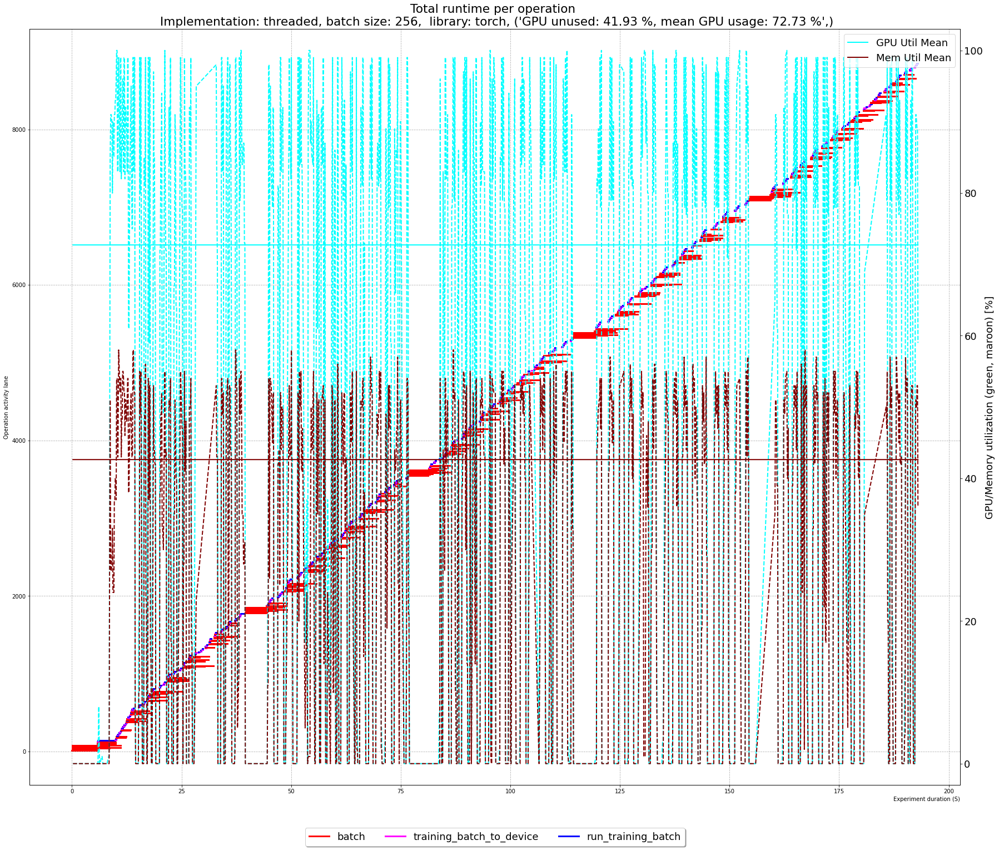

timestamp_2 True
76.09529612478674 21.131328707273195


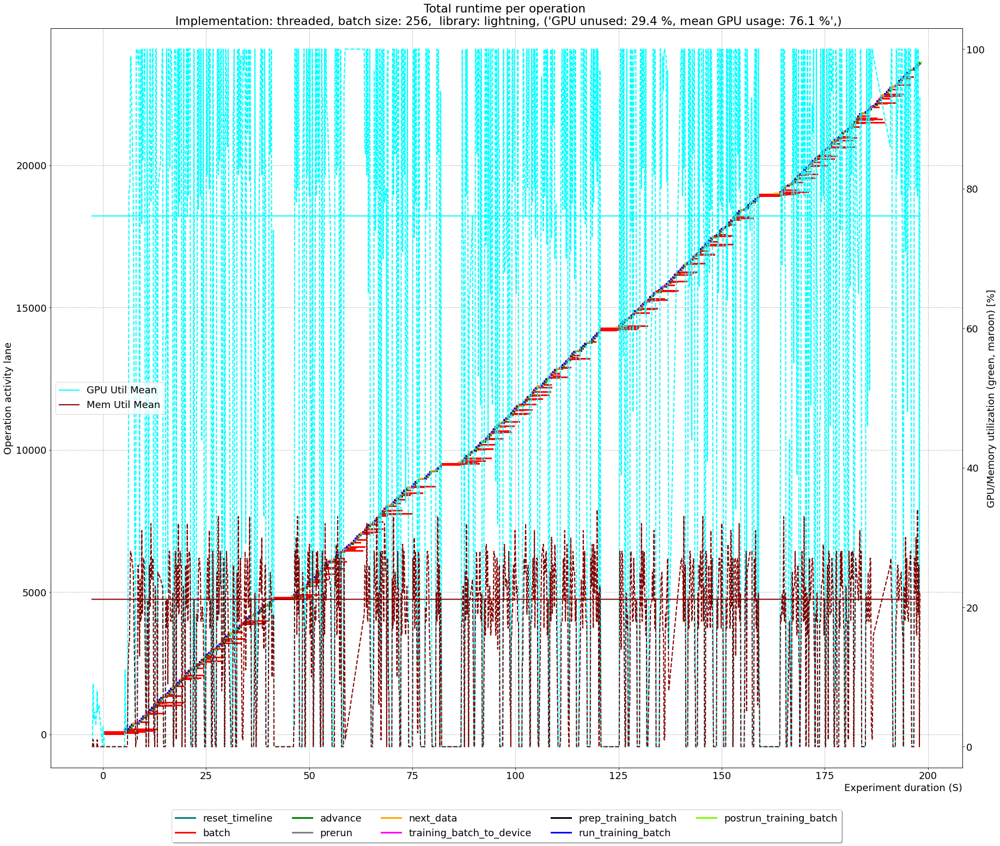

timestamp_2 True
76.00748941712797 41.63147208121828


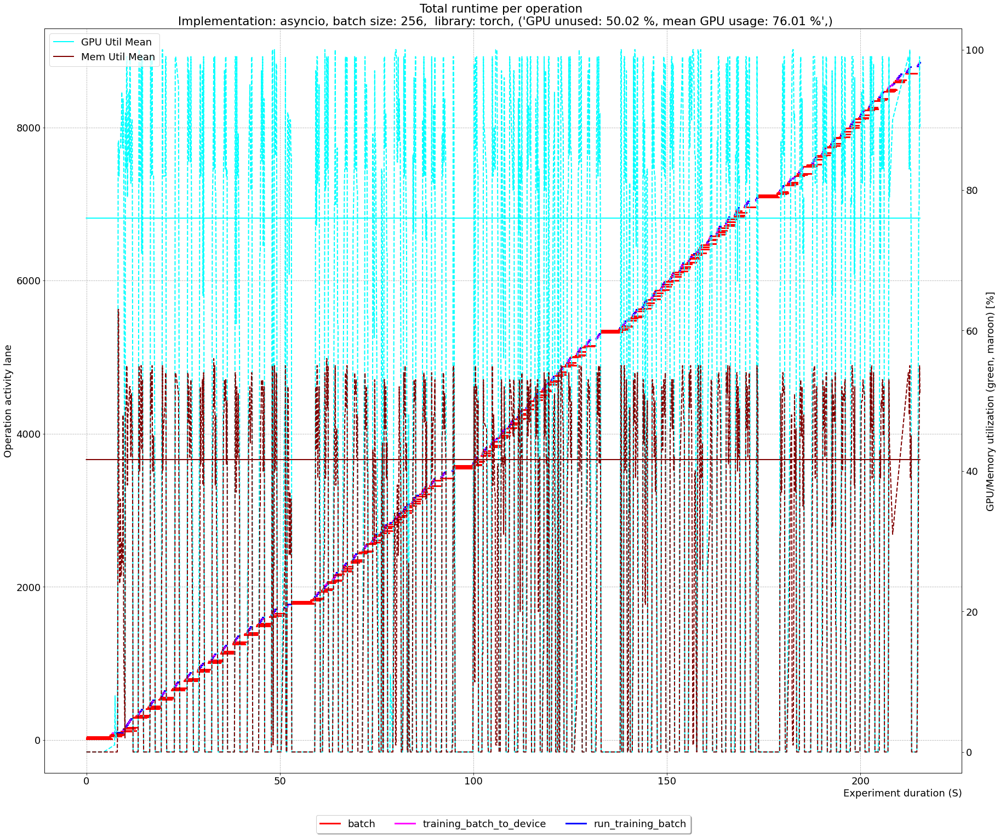

timestamp_2 True
78.59087582337155 21.600305888350753


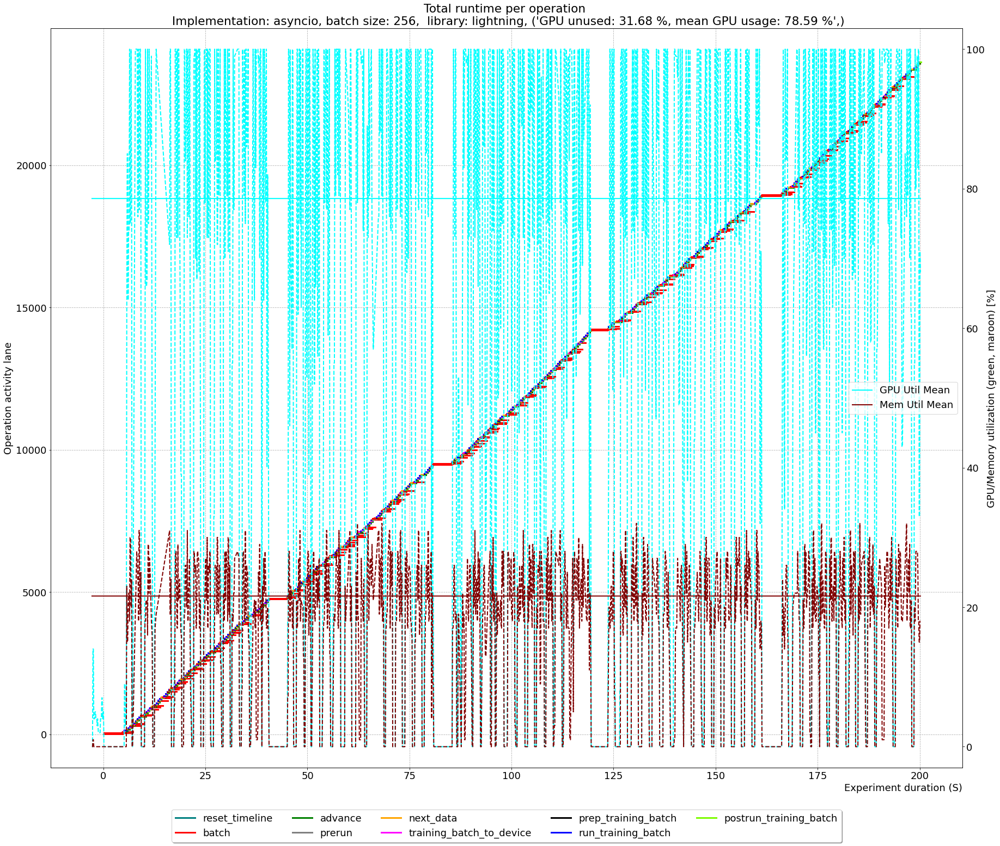

timestamp_2 True
72.85831960461284 42.973142657830486


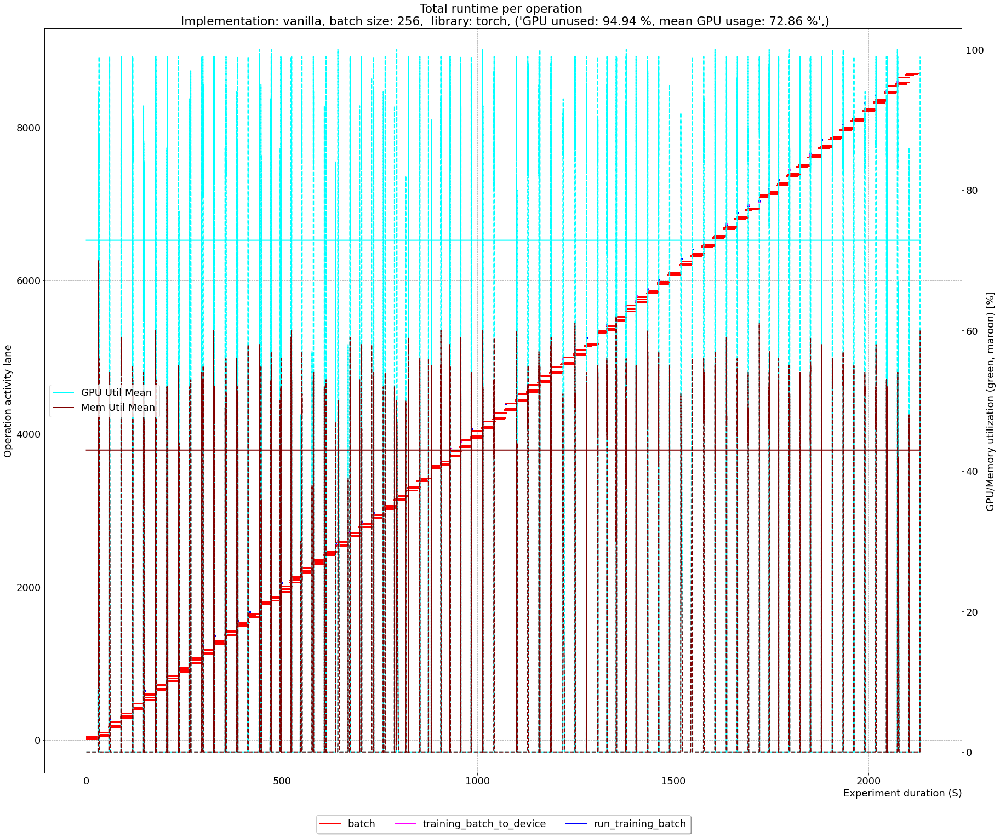

timestamp_2 True
64.34891216760677 18.924392439243924


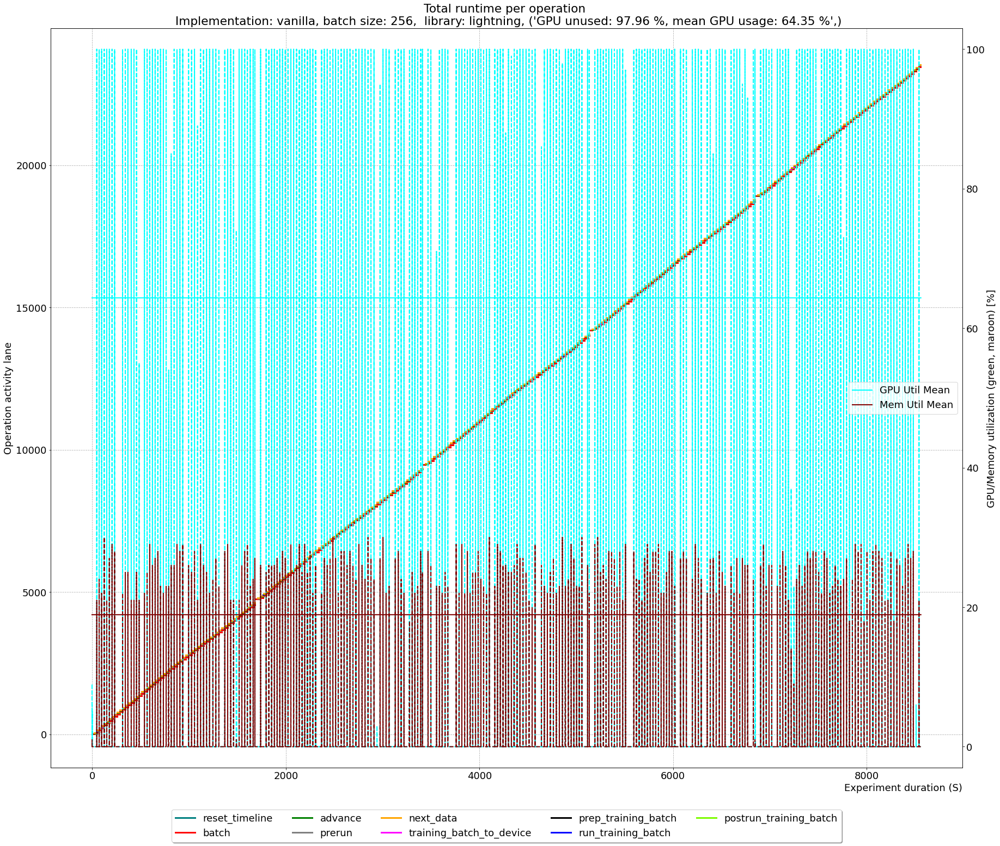

In [7]:
unique_runs_s3, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_s3)
returns_s3 = []

for run in sorted(unique_runs_s3):
    df = df_dataloader_s3[df_dataloader_s3["run"]==run]
    dfgpu = df_gpuutil_s3[df_gpuutil_s3["run"]==run]
    df = df.drop_duplicates(subset="id", keep="first", inplace=False) 
    result = show_timelines_with_gpu(df=df, gpu_util=dfgpu, lanes=lanes, colors=colors, run=run, 
                                     flat=False, show_gpu=True, zoom=False, zoom_epochs=2,
                                     skip_plot=False, ms=True)
    result["run"]=run
    returns_s3.append(result)

### Plot function timelines for local storage

timestamp_2 True
90.28078397954836 48.9370418283743


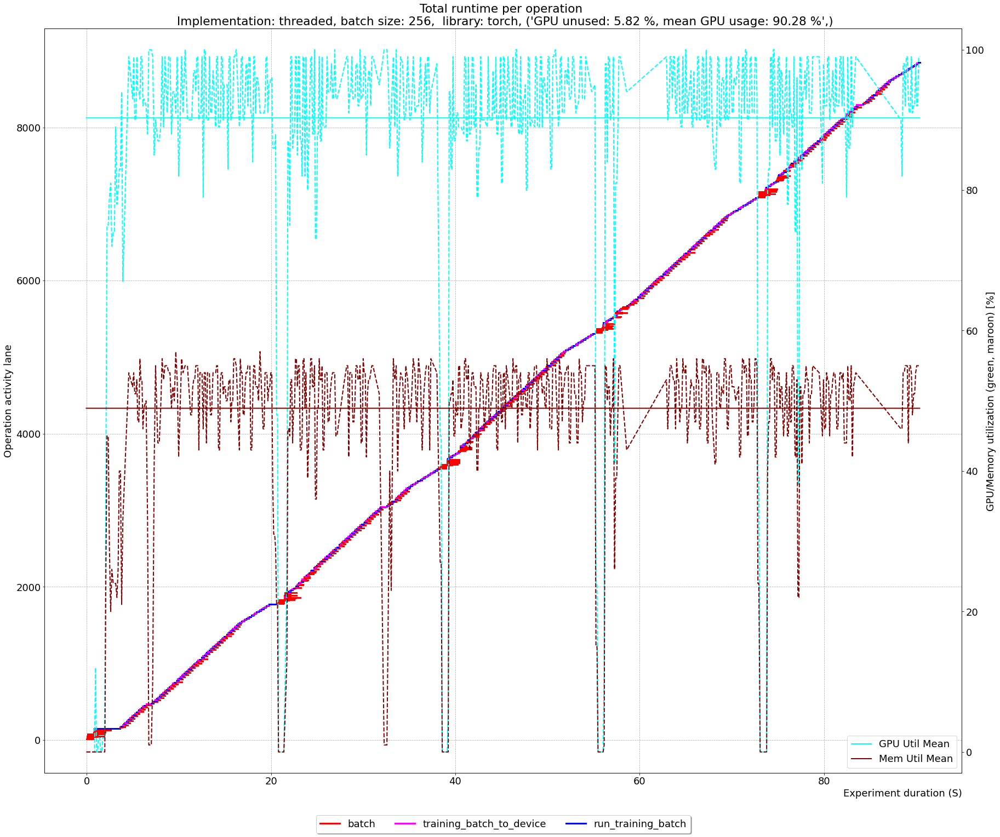

timestamp_2 True
84.13411154345006 23.127292054212067


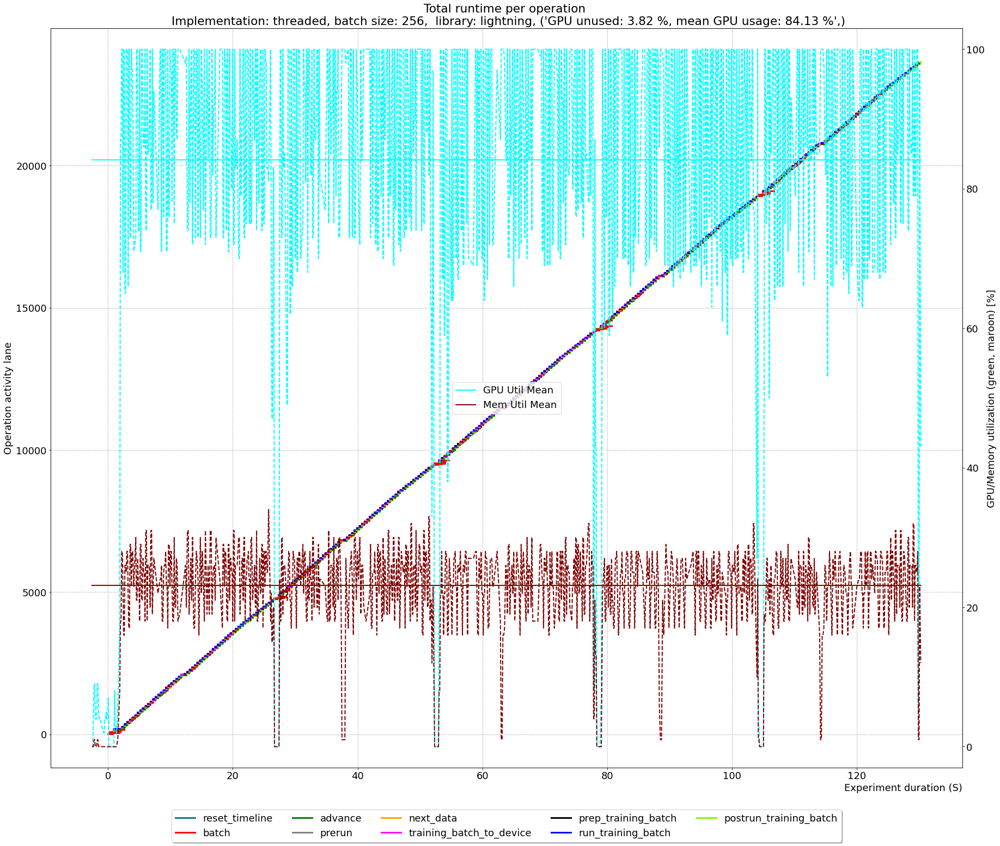

timestamp_2 True
88.24643584521385 47.040723981900456


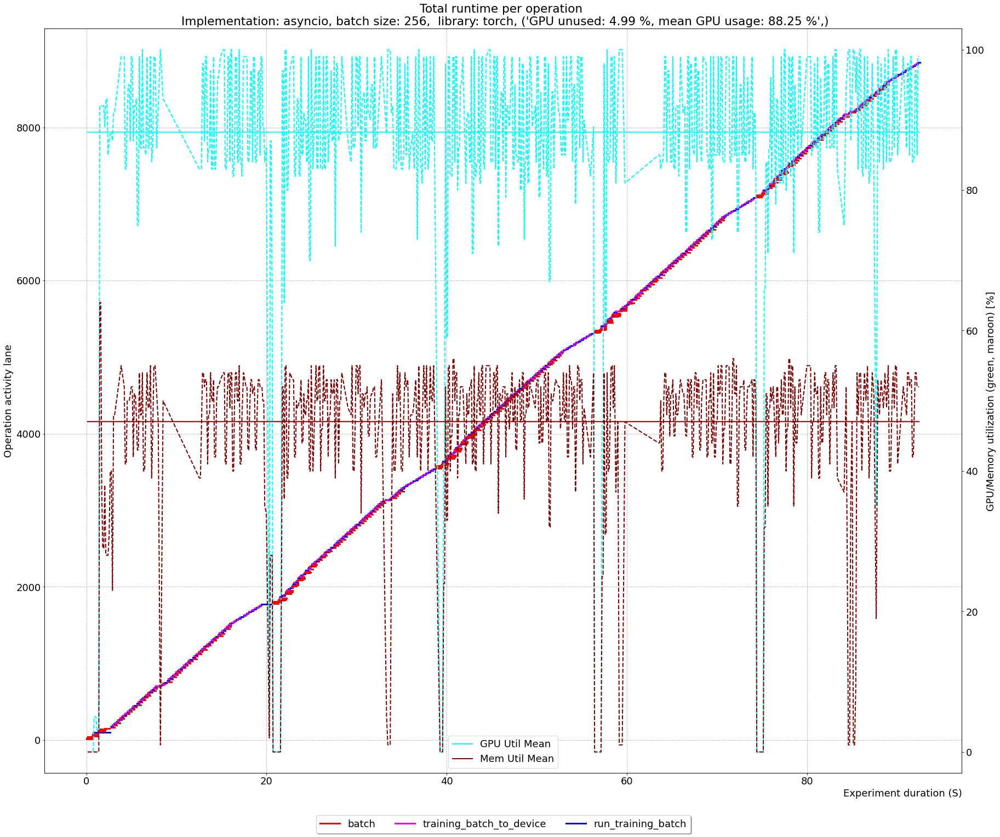

timestamp_2 True
84.40762463343108 23.120760959470637


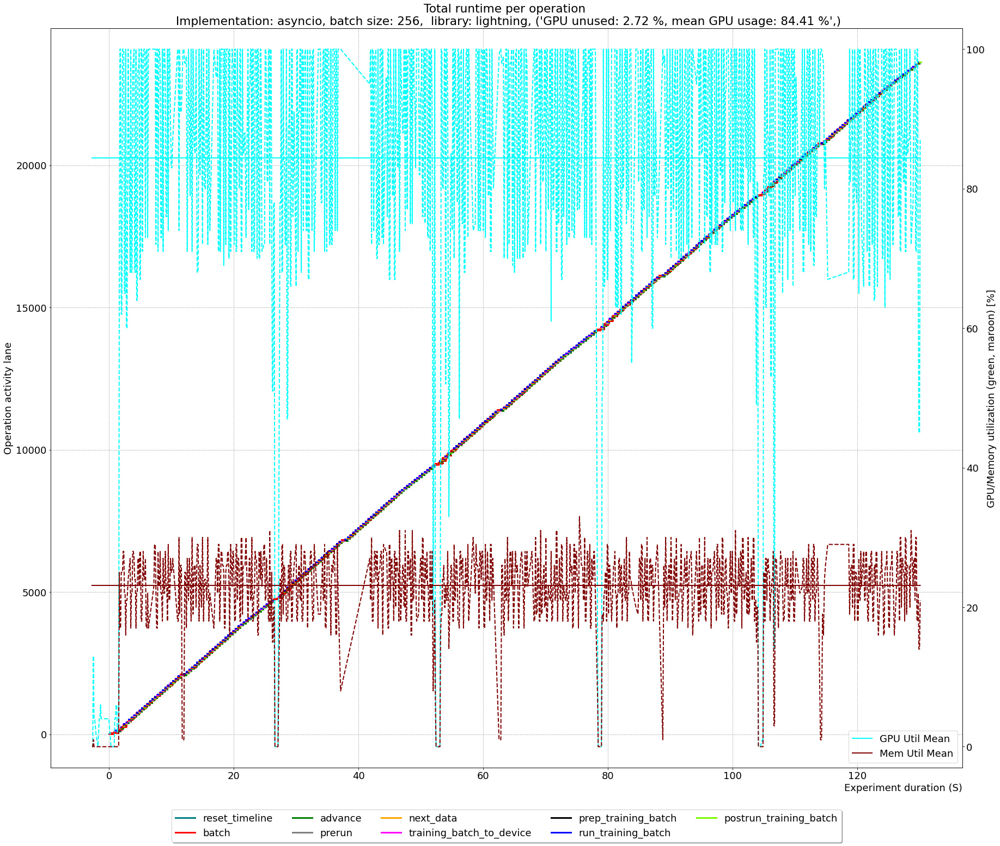

timestamp_2 True
78.1173083843109 43.232601414216596


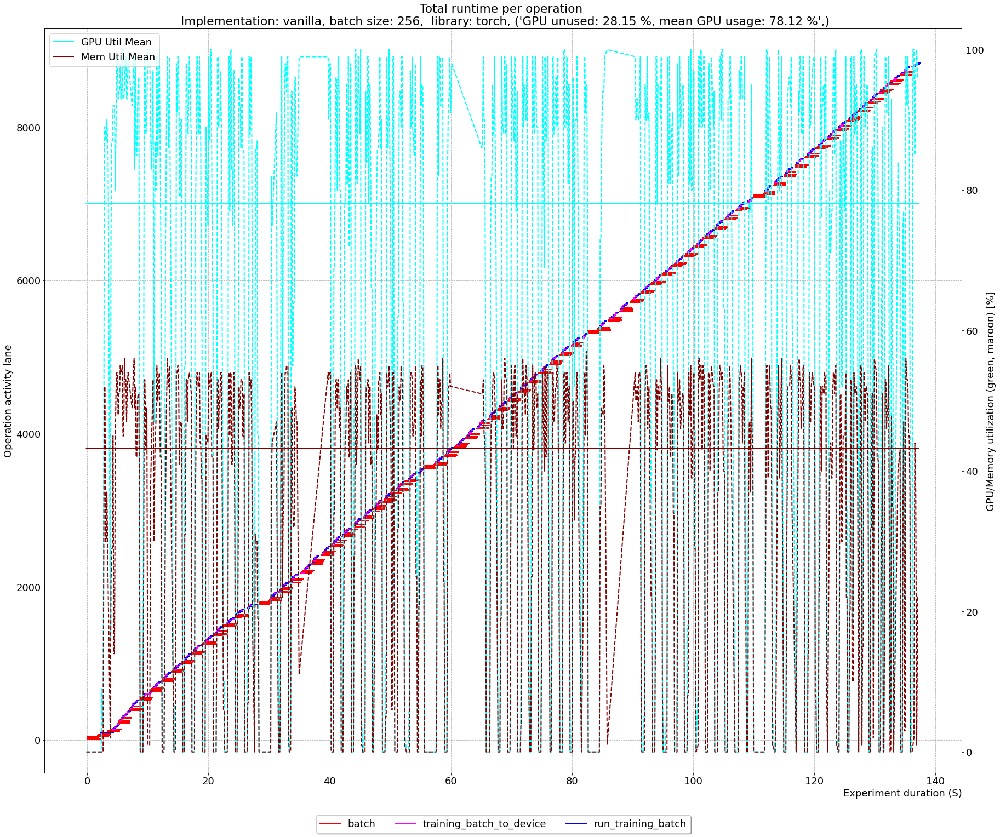

timestamp_2 True
64.48252326783867 18.524868209947282


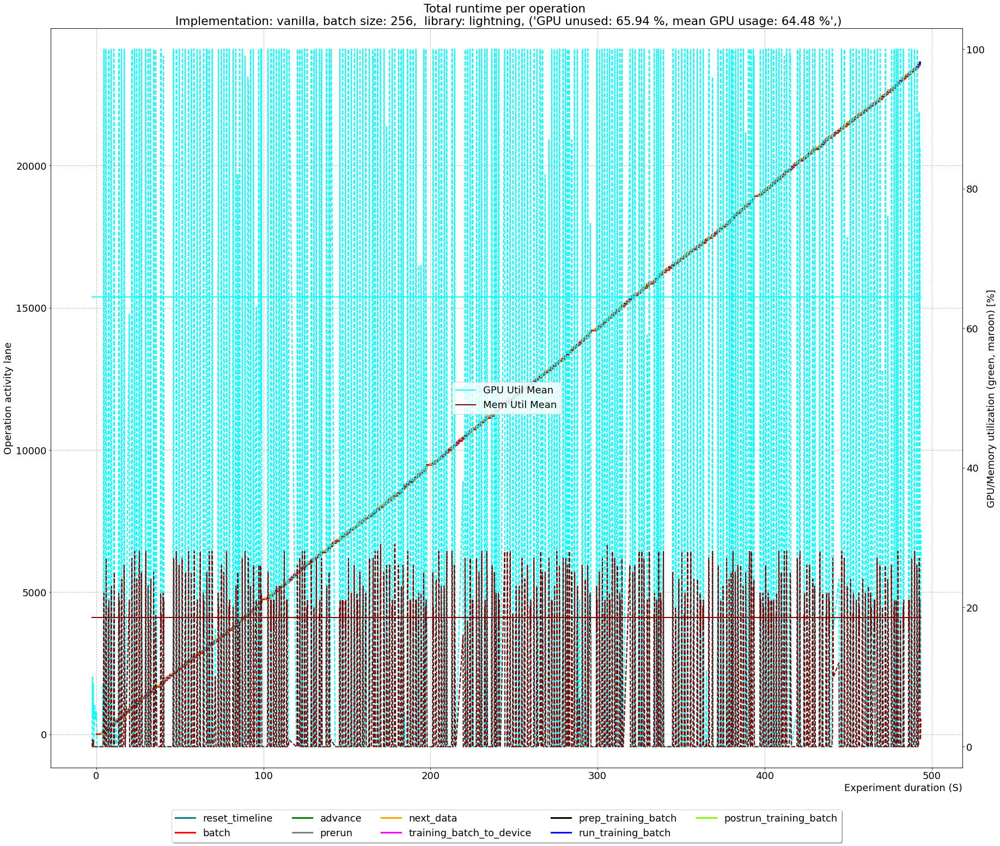

In [8]:
unique_runs_scratch, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_scratch)
returns_scratch = []

for run in sorted(unique_runs_scratch):
    df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
    dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
    df = df.drop_duplicates(subset="id", keep="first", inplace=False)
    result = show_timelines_with_gpu(df=df, gpu_util=dfgpu, lanes=lanes, colors=colors, run=run, 
                                     flat=False, show_gpu=True, zoom=False, zoom_epochs=2,
                                     skip_plot=False, ms=True)
    result["run"]=run
    returns_scratch.append(result)

Get unique runs to loop through, and plot the results

### Result tables
Print throughput in loaded images per second, and function duration in seconds, for S3 and Scratch

In [9]:
# sanity check
get_metadata_info(output_base_folder / "" / unique_runs_s3[0])

Dataset:  15000
Batch size: 256
Epochs:  5
Images total:  75000
Batches per epoch 59
Images total (rounded):  75520


(15000, 256, 5, 75000, 59, 75520)

In [10]:
df_full_s3 = extract_pandas(output_base_folder, folder_filter=s3_folder_filter)
results_s3 = pd.DataFrame.from_records(data=returns_s3)
r_s3 = get_throughput(results_s3, "", df_full_s3, unique_runs_s3, output_base_folder)
r_s3.round(2)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:10<00:00, 10.77it/s]


,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,throughput,dl_MB,imgs,Mbit/s,MB/s
0,192.78,41.93,72.73,23.23,42.63,threaded,1,torch,389.05,8035.28,75000,333.46,41.68
1,198.10,29.40,76.10,14.15,21.13,threaded,1,lightning,378.59,7802.14,75000,315.07,39.38
2,215.28,50.02,76.01,20.02,41.63,asyncio,1,torch,348.38,8464.63,75000,314.55,39.32
3,200.10,31.68,78.59,14.12,21.60,asyncio,1,lightning,374.82,8464.63,75000,338.42,42.30
4,2131.57,94.94,72.86,2.05,42.97,vanilla,1,torch,35.19,8464.63,75000,31.77,3.97
5,8558.15,97.96,64.35,0.35,18.92,vanilla,1,lightning,8.76,8464.63,75000,7.91,0.99


In [11]:
df_full_scratch = extract_pandas(output_base_folder, folder_filter=scratch_folder_filter)
results_scratch = pd.DataFrame.from_records(data=returns_scratch)
r_scratch = get_throughput(results_scratch, "", df_full_scratch, unique_runs_scratch, output_base_folder)
r_scratch.round(2)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:10<00:00, 10.88it/s]


,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,throughput,dl_MB,imgs,Mbit/s,MB/s
0,90.30,5.82,90.28,45.54,48.94,threaded,1,torch,830.61,9266.80,75000,821.02,102.63
1,130.03,3.82,84.13,21.71,23.13,threaded,1,lightning,576.78,9301.72,75000,572.27,71.53
2,92.38,4.99,88.25,44.26,47.04,asyncio,1,torch,811.87,8456.77,75000,732.35,91.54
3,130.00,2.72,84.41,21.75,23.12,asyncio,1,lightning,576.91,8456.77,75000,520.40,65.05
4,137.34,28.15,78.12,30.03,43.23,vanilla,1,torch,546.09,8456.77,75000,492.61,61.58
5,492.84,65.94,64.48,5.69,18.52,vanilla,1,lightning,152.18,8456.77,75000,137.27,17.16


In [12]:
# LaTeX style
# matplotlib.rcParams['mathtext.fontset'] = 'stix'
# matplotlib.rcParams['font.family'] = 'STIXGeneral'
# matplotlib.pyplot.title(r'ABC123 vs $\mathrm{ABC123}^{123}$')

# matplotlib.rcParams.update(matplotlib.rcParamsDefault)

In [13]:
torch_s3 = r_s3[r_s3["library"]=="torch"]
lightning_s3 = r_s3[r_s3["library"]=="lightning"]

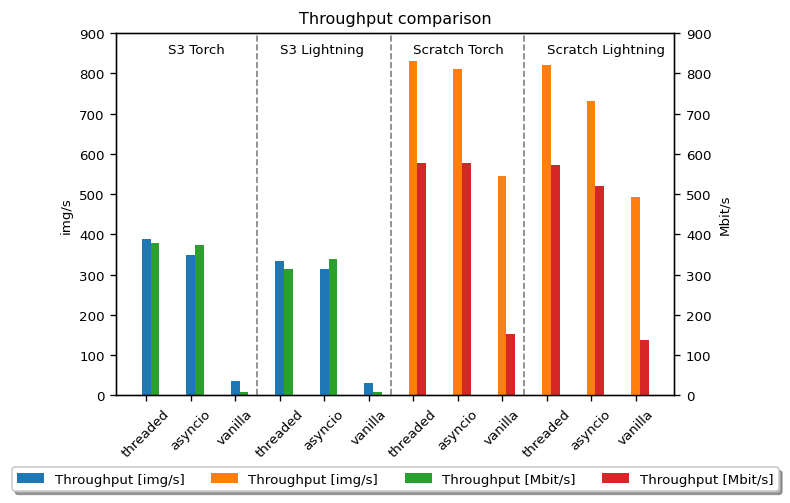

In [14]:
matplotlib.rcParams.update({'font.size': 8})
fig, ax = plt.subplots(dpi=120)
offset = 0
offset2 = 3

sc_offset = 6
sc_offset2 = 9

width = 0.2
labels = ['threaded', 'asyncio', 'vanilla', 'threaded', 'asyncio', 'vanilla'] * 2


ax2 = ax.twinx()
for lib, lab in zip(["torch", "lightning"], ["Throughput [img/s]", "Throughput [Mbit/s]"]):
    curr = r_s3[r_s3["library"]==lib]["throughput"]
    ax.bar(height=curr, x=np.arange(len(curr))+offset, width=width, label=lab)
    offset += 0.2
    curr = r_s3[r_s3["library"]==lib]["Mbit/s"]
    ax2.bar(height=curr, x=np.arange(len(curr))+offset2, width=width)
    offset2 += 0.2
    
    curr = r_scratch[r_scratch["library"]==lib]["throughput"]
    ax.bar(height=curr, x=np.arange(len(curr))+sc_offset, width=width, label=lab)
    sc_offset += 0.2
    curr = r_scratch[r_scratch["library"]==lib]["Mbit/s"]
    ax2.bar(height=curr, x=np.arange(len(curr))+sc_offset2, width=width)
    sc_offset2 += 0.2
    
ax.text(0.5, 850, "S3 Torch")
ax.text(3.0, 850, "S3 Lightning")
ax.text(6.0, 850, "Scratch Torch")
ax.text(9.0, 850, "Scratch Lightning")


ax.set_ylabel("img/s")
ax2.set_ylabel("Mbit/s")
    
ax.set_ylim([0, 900])
ax2.set_ylim([0, 900])
# ax.grid(linestyle="--", which="both")

ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.18),
          fancybox=True, shadow=True, ncol=5)

ax.set_xticks(np.arange(len(r_s3)*2), labels, rotation="45")
ax.set_title("Throughput comparison")
plt.axvline(x=2.5, color="gray", linestyle="--", linewidth=1)
plt.axvline(x=5.5, color="gray", linestyle="--", linewidth=1)
plt.axvline(x=8.5, color="gray", linestyle="--", linewidth=1)


In [15]:
!pip install latex

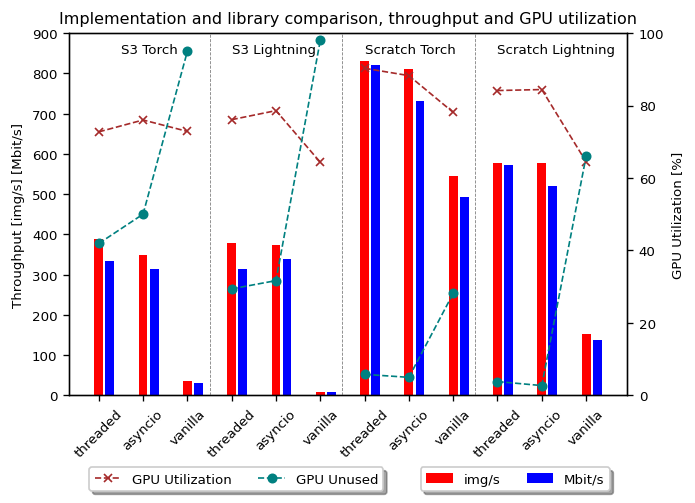

In [16]:

# plt.rcParams.update({
#   "text.usetex": True,
#   "font.family": "Helvetica"
# })
matplotlib.rcParams.update({'font.size': 8})
fig, ax = plt.subplots(dpi=120)
offset = 0
offset2 = 6
gpu_offset = 0
gpu_offset2 = 0

width = 0.2
labels = ['threaded', 'asyncio', 'vanilla', 'threaded', 'asyncio', 'vanilla'] * 2


ax2 = ax.twinx()
for lib, lab in zip(["torch", "lightning"], ["Throughput [img/s]", "Throughput [Mbit/s]"]):
    # S3
    curr = r_s3[r_s3["library"]==lib]["throughput"]
    ax.bar(height=curr, x=[i + offset for i in range(3)], width=width, label="img/s", color="red")
    curr = r_s3[r_s3["library"]==lib]["Mbit/s"]
    ax.bar(height=curr, x=[i + offset + 0.25 for i in range(3)], width=width, label="Mbit/s", color="blue")
    offset += 3
    # Scratch
    curr = r_scratch[r_scratch["library"]==lib]["throughput"]
    ax.bar(height=curr, x=[i + offset2 for i in range(3)], width=width, label="img/s", color="red")
    curr = r_scratch[r_scratch["library"]==lib]["Mbit/s"]
    ax.bar(height=curr, x=[i + offset2 + 0.25 for i in range(3)], width=width, label="Mbit/s", color="blue")
    offset2 += 3
    # GPU Util
    ax2.plot([i + gpu_offset for i in range(3)], r_s3[r_s3["library"]==lib]["gpu_util_mean_no_zeros"],
             marker = 'x', markersize = 5, color="brown", linestyle="--", linewidth=1, label="GPU Utilization")
    ax2.plot([i + gpu_offset for i in range(6, 9)], r_scratch[r_scratch["library"]==lib]["gpu_util_mean_no_zeros"],
         marker = 'x', markersize = 5, color="brown", linestyle="--", linewidth=1, label="GPU Utilization")
    gpu_offset += 3
    
    # GPU Unused
    ax2.plot([i + gpu_offset2 for i in range(3)], r_s3[r_s3["library"]==lib]["gpu_util_zero"],
             marker = 'o', markersize = 5, color="teal", linestyle="--", linewidth=1, label="GPU Unused")
    ax2.plot([i + gpu_offset2 for i in range(6, 9)], r_scratch[r_scratch["library"]==lib]["gpu_util_zero"],
         marker = 'o', markersize = 5, color="teal", linestyle="--", linewidth=1, label="GPU Unused")
    gpu_offset2 += 3
    
ax.text(0.5, 850, "S3 Torch")
ax.text(3.0, 850, "S3 Lightning")
ax.text(6.0, 850, "Scratch Torch")
ax.text(9.0, 850, "Scratch Lightning")


ax.set_ylabel("Throughput [img/s] [Mbit/s]")
ax2.set_ylabel("GPU Utilization [%]")
    
ax.set_ylim([0, 900])
ax2.set_ylim([0, 100])

ax.legend()
ax2.legend()


ax.set_xticks(np.arange(len(r_s3)*2), labels, rotation="45")
ax.set_title("Implementation and library comparison, throughput and GPU utilization")
plt.axvline(x=2.5, color="gray", linestyle="--", linewidth=0.5)
plt.axvline(x=5.5, color="gray", linestyle="--", linewidth=0.5)
plt.axvline(x=8.5, color="gray", linestyle="--", linewidth=0.5)

handles, labels = ax2.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax2.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.3, -0.18),
          fancybox=True, shadow=True, ncol=2)

handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.8, -0.18),
          fancybox=True, shadow=True, ncol=2)
